<a href="https://colab.research.google.com/github/michele-perrone/SpectrogramPlayer/blob/main/Source/Spectrogram_Player.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Spectrogram Player**
This notebooks provides a comparison of different existing approaches for the phase reconstruction of magnitude-only audio spectrograms.
The following approaches are implemented:

*   Griffin-Lim
*   MelGan
*   nVidia NeMo (HifiGan, UniGlow, SqueezeWave)



## Install the necessary toolkits

In [ ]:
!pip install nemo-toolkit[all]

In [ ]:
!pip install tqdm

## Import the necessary libraries

In [1]:
import matplotlib as plt
import numpy as np 
import matplotlib.pyplot as plt
import librosa, librosa.display
import IPython.display as ipd
import pathlib
import warnings
import random
import os
import torch
import soundfile as sf
import nemo
from pathlib import Path                                                                             
from tqdm import tqdm
import tensorflow as tf
from nemo.collections.tts.models.base import Vocoder
from nemo.collections.tts.models import HifiGanModel, MelGanModel, SqueezeWaveModel, UniGlowModel, UnivNetModel
import gc
from sklearn.metrics import mean_squared_error
from math import sqrt
import pickle

[NeMo W 2022-05-12 22:25:17 optimizers:55] Apex was not found. Using the lamb or fused_adam optimizer will error out.
[NeMo W 2022-05-12 22:25:18 experimental:28] Module <class 'nemo.collections.nlp.data.language_modeling.megatron.megatron_batch_samplers.MegatronPretrainingRandomBatchSampler'> is experimental, not ready for production and is not fully supported. Use at your own risk.


In [2]:
warnings.filterwarnings("ignore", category=FutureWarning)
# Random seed for reproducibility
seed = 42

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)

## Preprocess the datasets
The datasets have to be downloaded from Kaggle into your Google Drive or local folder first. If you haven't done so, you can use the Kaggle Dataset Importer notebook.

### Option 1: Load the datasets from Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
path_speech = pathlib.Path('/content/gdrive/MyDrive/SpectrogramPlayer/LJSPEECH11/wavs')
path_music = pathlib.Path('/content/gdrive/MyDrive/SpectrogramPlayer/GTZAN/genres_original')
path_urban = pathlib.Path('/content/gdrive/MyDrive/SpectrogramPlayer/URBAN8K/fold1') # NOTE: path of the first folder only
num_of_test_files = 20

In [ ]:
results_path = '/content/gdrive/MyDrive/SpectrogramPlayer/Results'

os.makedirs(results_path, exist_ok=True)
os.makedirs(os.path.join(results_path, 'Speech'), exist_ok=True)
os.makedirs(os.path.join(results_path, 'Music'), exist_ok=True)
os.makedirs(os.path.join(results_path, 'Urban'), exist_ok=True)

### Option 2: Load the datasets from local folders
**NOTE**: Make sure you set the correct `project_path` for your machine!

In [3]:
project_path = pathlib.Path('/home/michele/Projects/SpectrogramPlayer')

In [4]:
path_speech = pathlib.Path('./Datasets/LJSPEECH11/wavs')
path_speech = pathlib.Path(os.path.join(project_path, path_speech))

path_music = pathlib.Path('./Datasets/GTZAN/genres_original')
path_music = pathlib.Path(os.path.join(project_path, path_music))

path_urban = pathlib.Path('./Datasets/URBAN8K/fold1') # NOTE: path of the first folder only
path_urban = pathlib.Path(os.path.join(project_path, path_urban))

num_of_test_files = 20

In [5]:
print(path_speech)
print(path_music)
print(path_urban)

/home/michele/Projects/SpectrogramPlayer/Datasets/LJSPEECH11/wavs
/home/michele/Projects/SpectrogramPlayer/Datasets/GTZAN/genres_original
/home/michele/Projects/SpectrogramPlayer/Datasets/URBAN8K/fold1


In [6]:
results_path = pathlib.Path('./Results')
results_path = pathlib.Path(os.path.join(project_path, results_path))

os.makedirs(results_path, exist_ok=True)
os.makedirs(os.path.join(results_path, 'Speech'), exist_ok=True)
os.makedirs(os.path.join(results_path, 'Music'), exist_ok=True)
os.makedirs(os.path.join(results_path, 'Urban'), exist_ok=True)

### Do the processing

In [7]:
dataset_speech = {
    'signals': [], # sample rate = 22050Hz
    'lin_spec': [],
    'mel_spec': [],
}

dataset_music = {
    'signals': [], # sample rate = 22050Hz
    'lin_spec': [],
    'mel_spec': [],
}

dataset_urban = {
    'signals': [], # sample rate = 22050Hz
    'lin_spec': [],
    'mel_spec': [],
}

# STFT and MEL parameters
sr = 22050
n_fft = 1024
win_length = 1024
hop_length = 256
window = 'hann'
n_mels = 80
lowfreq = 0
highfreq = 8000
num_ceps = 20 # THIS IS FOR PLOTTING THE MFCCs WITH LIBROSA

kwargs = {"n_mels": n_mels, "fmin": lowfreq, "fmax": highfreq}

example_sample = 0 # used to plot and reproduce one example per dataset

In [8]:
class NemoSpec(tf.keras.Model):

  def __init__(self,
               sample_rate: int = 16000,
               n_fft: int = 1024,
               hop_length: int = 160,
               win_length: int = 400,
               n_mel_channels: int = 64,
               drop_dc: bool = True,
               mel_fmin: float = 60.0,
               mel_fmax: float = 7800.0,
               clip_value_min: float = 1e-5,
               clip_value_max: float = 1e8,
               log_amplitude: bool = True,
               n_mfcc_channels: int = None,
               postprocessing: bool = False,
               pad_to: int = 16,
               pad_value: float = -11.52):
    """
    Args:
      sample_rate: sampling rate. Need to be provided if `n_mel_channels` is not
        `None`.
      n_fft: length of the FFT, in samples.
      hop_length: length of the hop size, in samples.
      win_length: length of the window, in samples.
      n_mel_channels: number of mel channels. If set to None, will return the
        full magnitude STFT.
      drop_dc: if `True`, drop the STFT DC coefficient. Used only when
        n_mel_channels is `None`.
      mel_fmin: lowest frequency in the mel filterbank in Hz.
      mel_fmax: highest frequency in the mel filterbank in Hz.
      clip_value_min: minimal value of the (mel)-spectrogram before log. Used
        only when `log_amplitude` is `True`.
      clip_value_max: maximal value of the (mel)-spectrogram before log. Used
        only when `log_amplitude` is `True`.
      log_amplitude: if `True` apply log amplitude scaling.
      n_mfcc_channels: number of mfcc channels. If set to None, will return the
        full magnitude STFT or the mels.
    """

    super().__init__()

    self._n_fft = n_fft
    self._hop_length = hop_length
    self._win_length = win_length
    self._sample_rate = sample_rate
    self._clip_value_min = clip_value_min
    self._clip_value_max = clip_value_max
    self._log_amplitude = log_amplitude
    self._n_mel_channels = n_mel_channels
    self._n_mfcc_channels = n_mfcc_channels
    self._drop_dc = drop_dc
    self._postprocessing = postprocessing
    self._pad_to = pad_to
    self._pad_value = pad_value

    if n_mel_channels is None:
      self.mel_basis = None
    else:
      if sample_rate is None:
        raise ValueError(
            '`sample_rate` must be provided when `n_mel_channels` is not `None`'
        )
      if mel_fmax is None:
        mel_fmax = sample_rate // 2

      self.mel_basis = tf.convert_to_tensor(
          librosa.filters.mel(sample_rate, win_length, n_mels=n_mel_channels,
          fmin=mel_fmin, fmax=mel_fmax).T, dtype=tf.float32)

  def call(self, audio, training=False):
    """Computes the mel spectrogram of the input audio samples.

    Coefficients are clipped before log compression to avoid log(0) and large
    coefficients.

    Args:
      audio: input sample of shape (batch_size, num_samples).
      training: flag to distinguish between train and test time behavior.

    Returns:
      Mel spectrogram of shape (batch_size, time_frames, freq_bins).
    """
    fft = tf.signal.stft(
        audio,
        frame_length=self._win_length,
        frame_step=self._hop_length,
        fft_length=self._n_fft,
        window_fn=tf.signal.hann_window,
        pad_end=True)
    fft_modulus = tf.abs(fft)

    if self.mel_basis is not None:
      output = tf.matmul(fft_modulus, self.mel_basis)
    else:
      output = fft_modulus
      if self._drop_dc:
        output = output[:, :, 1:]

    if self._log_amplitude:
        output = tf.clip_by_value(
          output,
          clip_value_min=self._clip_value_min,
          clip_value_max=self._clip_value_max)
        output = tf.math.log(output)

    if self._n_mfcc_channels is not None:
      if self.mel_basis is None or self._n_mel_channels < self._n_mfcc_channels:
        raise ValueError('MFCCs require n_mel_channels >= n_mfcc_channels '
                         f'but n_mel_channels={self._n_mel_channels} '
                         f'and n_mfcc_channels={self._n_mfcc_channels}')
      if not self._log_amplitude:
        raise ValueError('MFCCs require log_amplitude=True')
      output = tf.signal.mfccs_from_log_mel_spectrograms(output)[
          ..., :self._n_mfcc_channels]

    if self._postprocessing:

        # pad to multiple of `pad_to` (for efficiency)
        pad_to = self._pad_to
        if pad_to == "max":
            output = np.pad(output, ((0,0), (0, self.max_length - output.shape[1]), (0,0)), constant_values=self._pad_value)
        elif pad_to > 0:
            pad_amt = output.shape[1] % pad_to
            if pad_amt != 0:
                output = np.pad(output, ((0,0), (0, pad_to - pad_amt), (0,0)), constant_values=self._pad_value)

    # Transpose output to the desired shape
    output = tf.transpose(output, perm=[0, 2, 1])

    return output

In [9]:
extractMel = NemoSpec(sample_rate=22050,
           n_fft=1024,
           hop_length=256,
           win_length=1024,
           n_mel_channels=80,
           mel_fmin=0,
           mel_fmax=8000,
           clip_value_min=1e-5,
           clip_value_max=1e8,
           log_amplitude=True,
           n_mfcc_channels=None,
           postprocessing=False)

2022-05-12 22:25:55.547586: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-05-12 22:25:55.548203: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-05-12 22:25:55.549247: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


In [10]:
# by default files are loaded as Mono

# LJSpeech11
loop1 = tqdm(enumerate(path_speech.iterdir()), total=num_of_test_files)
for index, file in loop1:
        if index > num_of_test_files:
            break
        signal, _ = librosa.load(file)
        dataset_speech['signals'].append(signal)
        dataset_speech['lin_spec'].append(abs(librosa.stft(signal)))
        signal = signal[None,:]
        dataset_speech['mel_spec'].append(extractMel.call(signal))

        loop1.set_description(f"Processing speech: [{index}/{num_of_test_files}]")

# Gtzan
# here, since the dataset is divided into class folders we take num_files // num folders signals per class
num_of_classes = len(os.listdir(path_music))
samples_per_class = num_of_test_files // num_of_classes

loop2 = tqdm(path_music.iterdir(), total=num_of_classes)

base_index = -2

for class_folder in loop2:
  base_index += 2 
  if class_folder.is_dir():  
    for index, file in enumerate(class_folder.iterdir()):
        if index > samples_per_class:
            break
        signal, _ = librosa.load(file)
        dataset_music['signals'].append(signal)
        dataset_music['lin_spec'].append(abs(librosa.stft(signal)))
        signal = signal[None,:]
        mel = extractMel.call(signal)
        dataset_music['mel_spec'].append(mel)
        loop2.set_description(f"Processing [{str(class_folder).split('/')[-1]}] in music: {index+base_index}/{num_of_test_files}");


# Urban8k
# here, the dataset is divided into balanced folds. We consider only the first one.
loop3 = tqdm(enumerate(path_urban.iterdir()), total=num_of_test_files)
for index, file in loop3:
        if index > num_of_test_files:
            break
        signal, _ = librosa.load(file)
        dataset_urban['signals'].append(signal)
        dataset_urban['lin_spec'].append(abs(librosa.stft(signal)))
        signal = signal[None,:]
        dataset_urban['mel_spec'].append(extractMel.call(signal))
        loop3.set_description(f"Processing urban: [{index}/{num_of_test_files}]")


# Examples of audio samples from each dataset
print('\n')
print('Speech:')
ipd.display(ipd.Audio(dataset_speech['signals'][example_sample], rate = sr))
print("\n")
print('Music:')
ipd.display(ipd.Audio(dataset_music['signals'][example_sample], rate = sr))
print("\n")
print('Urban:')
ipd.display(ipd.Audio(dataset_urban['signals'][example_sample], rate = sr))
print("\n")


Processing speech: [20/20]: : 21it [00:01, 16.09it/s]
Processing [blues] in music: 20/20: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:07<00:00,  1.34it/s]
Processing urban: [20/20]: : 21it [00:03,  5.41it/s]                                                                                                                                        



Speech:




Music:




Urban:


In [11]:
# for simplicity, we save all original signals in the folders of the results
np.save(os.path.join(os.path.join(results_path, 'Speech'), 'signals_speech.npy'), np.asarray(dataset_speech['signals']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'signals_music.npy'), np.asarray(dataset_music['signals']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'signals_urban.npy'), np.asarray(dataset_urban['signals']))

[NeMo W 2022-05-12 22:26:08 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      
    
[NeMo W 2022-05-12 22:26:08 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      This is separate from the ipykernel package so we can avoid doing imports until
    
[NeMo W 2022-05-12 22:26:08 nemo_logging:349] /home/miche

In [12]:
def match_signals_length(sig_1, sig_2):
  if len(sig_2) < len(sig_1):
    pad_len = len(sig_1)-len(sig_2)
    padding = np.zeros(pad_len)
    sig_2 = np.append(sig_2, padding)
  else:
    sig_2 = sig_2[:len(sig_1)]
  return sig_2

## Load the preprocessed datasets
If you have already run the previous block, you can import the processed datasets istead of processing them every time.

In [ ]:
dataset_speech = np.load(os.path.join(os.path.join(results_path, 'Speech'), 'signals_speech.npy'))
dataset_music = np.load(os.path.join(os.path.join(results_path, 'Music'), 'signals_music.npy'))
dataset_urban = np.load(os.path.join(os.path.join(results_path, 'Urban'), 'signals_urban.npy'))

## Griffin-Lim test

In [13]:
# testing Griffin Lim with all datasets
griffin_lim_results = {
    'speech': [],
    'music': [],
    'urban': [],
}

no_phase_results = {
    'speech': [],
    'music': [],
    'urban': [],
}


In [14]:
for i in range(num_of_test_files):
  current_speech = dataset_speech['signals'][i]
  current_music = dataset_music['signals'][i]
  current_urban = dataset_urban['signals'][i]
  
  speech_spec = dataset_speech['lin_spec'][i]
  music_spec = dataset_music['lin_spec'][i]
  urban_spec = dataset_urban['lin_spec'][i]
  
  griffin_lim_results['speech'].append(match_signals_length(current_speech, librosa.griffinlim(speech_spec)))
  no_phase_results['speech'].append(match_signals_length(current_speech, librosa.istft(speech_spec)))

  griffin_lim_results['music'].append(match_signals_length(current_music, librosa.griffinlim(music_spec)))
  no_phase_results['music'].append(match_signals_length(current_music, librosa.istft(music_spec)))

  griffin_lim_results['urban'].append(match_signals_length(current_urban, librosa.griffinlim(urban_spec)))
  no_phase_results['urban'].append(match_signals_length(current_urban, librosa.istft(urban_spec)))

In [15]:
np.save(os.path.join(os.path.join(results_path, 'Speech'), 'griffin_lim_speech.npy'), np.asarray(griffin_lim_results['speech']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'griffin_lim_music.npy'), np.asarray(griffin_lim_results['music']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'griffin_lim_urban.npy'), np.asarray(griffin_lim_results['urban']))

np.save(os.path.join(os.path.join(results_path, 'Speech'), 'no_phase_speech.npy'), np.asarray(no_phase_results['speech']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'no_phase_music.npy'), np.asarray(no_phase_results['music']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'no_phase_urban.npy'), np.asarray(no_phase_results['urban']))

[NeMo W 2022-05-12 22:27:18 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      """Entry point for launching an IPython kernel.
    
[NeMo W 2022-05-12 22:27:18 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      
    
[NeMo W 2022-05-12 22:27:18 nemo_logging:349] /home/michele/Apps/anaconda3/envs/Spectrogr

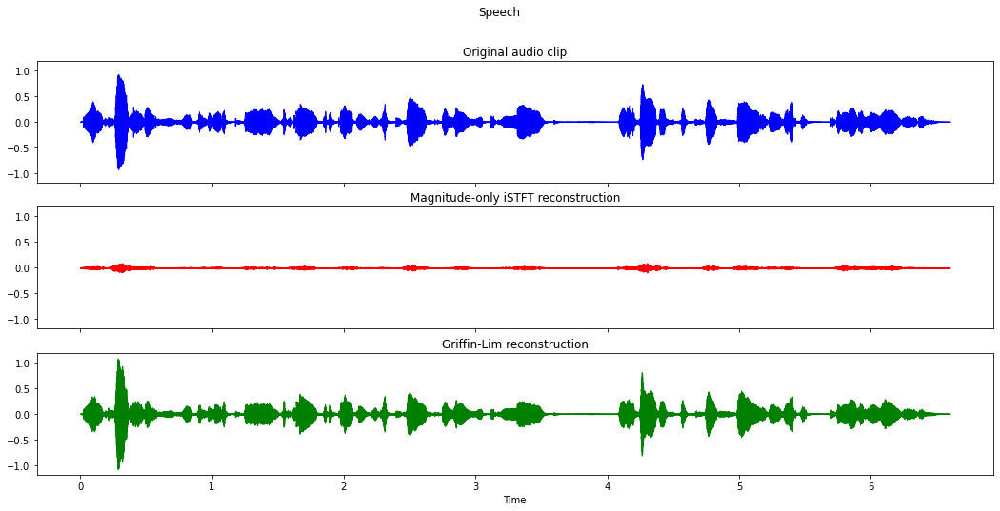

In [16]:
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(18,8))

plt.suptitle('Speech')
librosa.display.waveshow(dataset_speech['signals'][example_sample], sr=sr, color='b', ax=ax[0])
ax[0].set(title='Original audio clip', xlabel=None)
ax[0].label_outer()
librosa.display.waveshow(no_phase_results['speech'][example_sample], sr=sr, color='r', ax=ax[1])
ax[1].set(title='Magnitude-only iSTFT reconstruction', xlabel=None)
ax[1].label_outer()
librosa.display.waveshow(griffin_lim_results['speech'][example_sample], sr=sr, color='g', ax=ax[2])
ax[2].set(title='Griffin-Lim reconstruction');

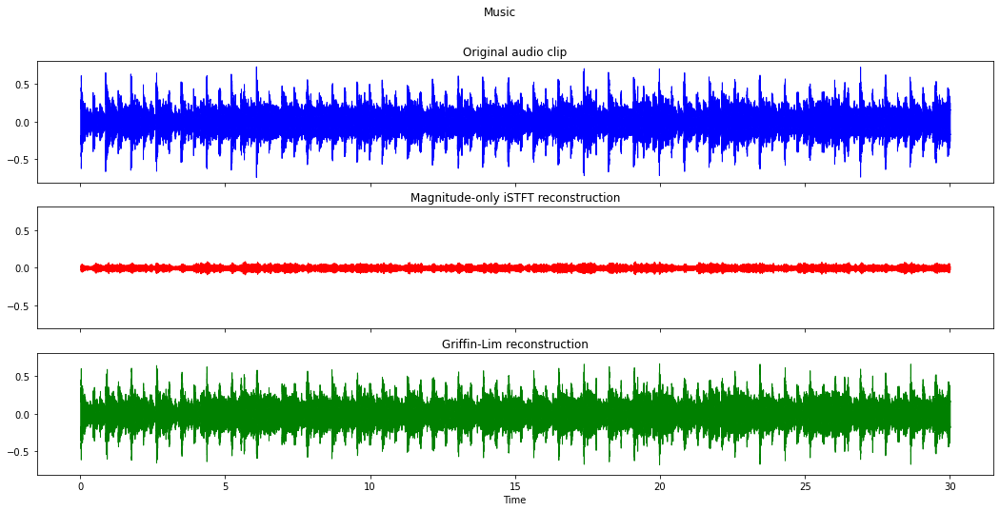

In [17]:
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(18,8))

plt.suptitle('Music')
librosa.display.waveshow(dataset_music['signals'][example_sample], sr=sr, color='b', ax=ax[0])
ax[0].set(title='Original audio clip', xlabel=None)
ax[0].label_outer()
librosa.display.waveshow(no_phase_results['music'][example_sample], sr=sr, color='r', ax=ax[1])
ax[1].set(title='Magnitude-only iSTFT reconstruction', xlabel=None)
ax[1].label_outer()
librosa.display.waveshow(griffin_lim_results['music'][example_sample], sr=sr, color='g', ax=ax[2])
ax[2].set(title='Griffin-Lim reconstruction');

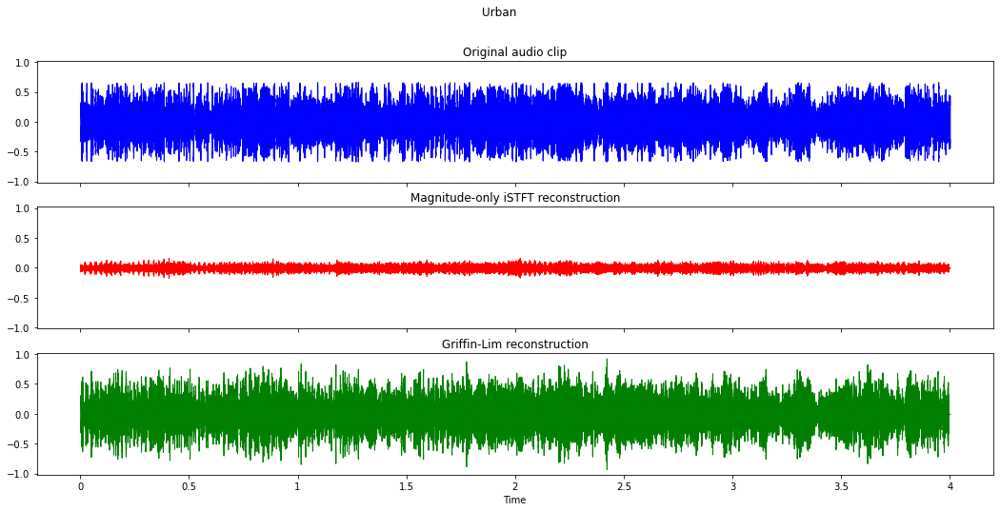

In [18]:
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(18,8))

plt.suptitle('Urban')
librosa.display.waveshow(dataset_urban['signals'][example_sample], sr=sr, color='b', ax=ax[0])
ax[0].set(title='Original audio clip', xlabel=None)
ax[0].label_outer()
librosa.display.waveshow(no_phase_results['urban'][example_sample], sr=sr, color='r', ax=ax[1])
ax[1].set(title='Magnitude-only iSTFT reconstruction', xlabel=None)
ax[1].label_outer()
librosa.display.waveshow(griffin_lim_results['urban'][example_sample], sr=sr, color='g', ax=ax[2])
ax[2].set(title='Griffin-Lim reconstruction');

## MelGan test (don't use this - use the NeMo model instead)

In [ ]:
torch.cuda.empty_cache()
gc.collect()

In [ ]:
# Load the MelGan vocoder from the Torch hub

melgan_vocoder = MelGanModel.from_pretrained(model_name="tts_melgan")

In [ ]:
melgan_results = {
    'speech': [],
    'music': [],
    'urban': [],
}

In [ ]:
# Use MelGan to reconstruct the audio clip
model = melgan_vocoder

for i in range(num_of_test_files):
  current_speech = dataset_speech['signals'][i]
  current_music = dataset_music['signals'][i]
  current_urban = dataset_urban['signals'][i]
  
  speech_mel = dataset_speech['mel_spec'][i]
  music_mel = dataset_music['mel_spec'][i]
  urban_mel = dataset_urban['mel_spec'][i]
  
  tensor = torch.Tensor(np.array(speech_mel)).to('cuda')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  melgan_results['speech'].append(match_signals_length(current_speech, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(music_mel)).to('cuda')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  melgan_results['music'].append(match_signals_length(current_music, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(urban_mel)).to('cuda')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  melgan_results['urban'].append(match_signals_length(current_urban, audio_result.squeeze().detach().cpu().numpy()))

In [ ]:
np.save(os.path.join(os.path.join(results_path, 'Speech'), 'melgan_speech.npy'), np.asarray(melgan_results['speech']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'melgan_music.npy'), np.asarray(melgan_results['music']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'melgan_urban.npy'), np.asarray(melgan_results['urban']))

In [ ]:
# Clear the cache

torch.cuda.empty_cache()
gc.collect()

## NeMo test

### Initialize the output dictionaries

In [19]:
hifigan_results = {
    'speech': [],
    'music': [],
    'urban': [],
}

squeezewave_results = {
    'speech': [],
    'music': [],
    'urban': [],
}

uniglow_results = {
    'speech': [],
    'music': [],
    'urban': [],
}

univnet_results = {
    'speech': [],
    'music': [],
    'urban': [],
}

melgan_results = {
    'speech': [],
    'music': [],
    'urban': [],
}

### HiFiGan

In [20]:
hifigan_vocoder = HifiGanModel.from_pretrained(model_name="tts_hifigan").cpu()

[NeMo I 2022-05-12 22:27:40 cloud:56] Found existing object /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_hifigan/e6da322f0f7e7dcf3f1900a9229a7e69/tts_hifigan.nemo.
[NeMo I 2022-05-12 22:27:40 cloud:62] Re-using file from: /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_hifigan/e6da322f0f7e7dcf3f1900a9229a7e69/tts_hifigan.nemo
[NeMo I 2022-05-12 22:27:40 common:747] Instantiating model from pre-trained checkpoint


[NeMo W 2022-05-12 22:27:42 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.MelAudioDataset
      manifest_filepath: /home/fkreuk/data/train_finetune.txt
      min_duration: 0.75
      n_segments: 8192
    dataloader_params:
      drop_last: false
      shuffle: true
      batch_size: 64
      num_workers: 4
    
[NeMo W 2022-05-12 22:27:42 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.MelAudioDataset
      manifest_filepath: /home/fkreuk/data/val_finetune.txt
      min_duration: 3
      n_segments: 66150


[NeMo I 2022-05-12 22:27:42 features:259] PADDING: 0
[NeMo I 2022-05-12 22:27:42 features:276] STFT using torch


[NeMo W 2022-05-12 22:27:42 features:234] Using torch_stft is deprecated and has been removed. The values have been forcibly set to False for FilterbankFeatures and AudioToMelSpectrogramPreprocessor. Please set exact_pad to True as needed.


[NeMo I 2022-05-12 22:27:42 features:259] PADDING: 0
[NeMo I 2022-05-12 22:27:42 features:276] STFT using torch
[NeMo I 2022-05-12 22:27:46 save_restore_connector:209] Model HifiGanModel was successfully restored from /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_hifigan/e6da322f0f7e7dcf3f1900a9229a7e69/tts_hifigan.nemo.


In [21]:
# Generate the audio (hifigan)
model = hifigan_vocoder

for i in range(num_of_test_files):
  current_speech = dataset_speech['signals'][i]
  current_music = dataset_music['signals'][i]
  current_urban = dataset_urban['signals'][i]

  speech_mel = dataset_speech['mel_spec'][i]
  music_mel = dataset_music['mel_spec'][i]
  urban_mel = dataset_urban['mel_spec'][i]
  
  tensor = torch.Tensor(np.array(speech_mel)).to('cpu')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  hifigan_results['speech'].append(match_signals_length(current_speech, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(music_mel)).to('cpu')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  hifigan_results['music'].append(match_signals_length(current_music, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(urban_mel)).to('cpu')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  hifigan_results['urban'].append(match_signals_length(current_urban, audio_result.squeeze().detach().cpu().numpy()))

In [22]:
np.save(os.path.join(os.path.join(results_path, 'Speech'), 'hifigan_speech.npy'), np.asarray(hifigan_results['speech']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'hifigan_music.npy'), np.asarray(hifigan_results['music']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'hifigan_urban.npy'), np.asarray(hifigan_results['urban']))

[NeMo W 2022-05-12 22:31:00 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      """Entry point for launching an IPython kernel.
    
[NeMo W 2022-05-12 22:31:00 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      
    
[NeMo W 2022-05-12 22:31:00 nemo_logging:349] /home/michele/Apps/anaconda3/envs/Spectrogr

In [23]:
torch.cuda.empty_cache()
gc.collect()

32124

### SqueezeWave

In [24]:
squeezewave_vocoder = SqueezeWaveModel.from_pretrained(model_name="tts_squeezewave").cuda()

[NeMo I 2022-05-12 22:32:24 cloud:56] Found existing object /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_squeezewave/d48f5835ac007ddb0c183bdbbbdace28/tts_squeezewave.nemo.
[NeMo I 2022-05-12 22:32:24 cloud:62] Re-using file from: /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_squeezewave/d48f5835ac007ddb0c183bdbbbdace28/tts_squeezewave.nemo
[NeMo I 2022-05-12 22:32:24 common:747] Instantiating model from pre-trained checkpoint


[NeMo W 2022-05-12 22:32:24 features:234] Using torch_stft is deprecated and has been removed. The values have been forcibly set to False for FilterbankFeatures and AudioToMelSpectrogramPreprocessor. Please set exact_pad to True as needed.


[NeMo I 2022-05-12 22:32:24 features:259] PADDING: 1
[NeMo I 2022-05-12 22:32:24 features:276] STFT using torch


[NeMo W 2022-05-12 22:32:24 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/nemo/collections/tts/modules/submodules.py:193: UserWarning: torch.qr is deprecated in favor of torch.linalg.qr and will be removed in a future PyTorch release.
    The boolean parameter 'some' has been replaced with a string parameter 'mode'.
    Q, R = torch.qr(A, some)
    should be replaced with
    Q, R = torch.linalg.qr(A, 'reduced' if some else 'complete') (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1980.)
      W = torch.qr(torch.FloatTensor(c, c).normal_())[0]
    
[NeMo W 2022-05-12 22:32:25 squeezewave:238] Loading old checkpoint, defaulting to hann window.


[NeMo I 2022-05-12 22:32:25 save_restore_connector:209] Model SqueezeWaveModel was successfully restored from /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_squeezewave/d48f5835ac007ddb0c183bdbbbdace28/tts_squeezewave.nemo.


In [25]:
# Generate the audio (squeezewave)

model = squeezewave_vocoder

for i in range(num_of_test_files):
  current_speech = dataset_speech['signals'][i]
  current_music = dataset_music['signals'][i]
  current_urban = dataset_urban['signals'][i]

  speech_mel = dataset_speech['mel_spec'][i]
  music_mel = dataset_music['mel_spec'][i]
  urban_mel = dataset_urban['mel_spec'][i]
  
  tensor = torch.Tensor(np.array(speech_mel)).to('cuda')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  squeezewave_results['speech'].append(match_signals_length(current_speech, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(music_mel)).to('cuda')
  if not tensor.ndim == 3:
    tensor = tensor[None, :, :]
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  squeezewave_results['music'].append(match_signals_length(current_music, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(urban_mel)).to('cuda')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  squeezewave_results['urban'].append(match_signals_length(current_urban, audio_result.squeeze().detach().cpu().numpy()))

[NeMo W 2022-05-12 22:32:25 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/torch/functional.py:696: UserWarning: stft will soon require the return_complex parameter be given for real inputs, and will further require that return_complex=True in a future PyTorch release. (Triggered internally at  ../aten/src/ATen/native/SpectralOps.cpp:798.)
      normalized, onesided, return_complex)
    


In [26]:
np.save(os.path.join(os.path.join(results_path, 'Speech'), 'squeezewave_speech.npy'), np.asarray(squeezewave_results['speech']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'squeezewave_music.npy'), np.asarray(squeezewave_results['music']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'squeezewave_urban.npy'), np.asarray(squeezewave_results['urban']))

[NeMo W 2022-05-12 22:32:29 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      """Entry point for launching an IPython kernel.
    
[NeMo W 2022-05-12 22:32:29 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      
    
[NeMo W 2022-05-12 22:32:29 nemo_logging:349] /home/michele/Apps/anaconda3/envs/Spectrogr

In [27]:
torch.cuda.empty_cache()
gc.collect()

327

### UniGlow

In [28]:
uniglow_vocoder = UniGlowModel.from_pretrained(model_name="tts_uniglow").cuda()

[NeMo I 2022-05-12 22:32:33 cloud:56] Found existing object /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_uniglow/6d1602a9610471099e8fcc2d29e5ae9a/tts_uniglow.nemo.
[NeMo I 2022-05-12 22:32:33 cloud:62] Re-using file from: /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_uniglow/6d1602a9610471099e8fcc2d29e5ae9a/tts_uniglow.nemo
[NeMo I 2022-05-12 22:32:33 common:747] Instantiating model from pre-trained checkpoint


[NeMo W 2022-05-12 22:32:33 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.AudioDataset
      manifest_filepath: /home/tlv/data/LJSpeech-1.1/train.txt
      max_duration: null
      min_duration: 0.1
      n_segments: 16384
      trim: false
    dataloader_params:
      drop_last: false
      shuffle: true
      batch_size: 12
      num_workers: 4
    
[NeMo W 2022-05-12 22:32:33 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.AudioDataset
      manifest_filepath: /home/tlv/data/LJSpeech-1.1/val.txt
      m

[NeMo I 2022-05-12 22:32:33 features:259] PADDING: 0
[NeMo I 2022-05-12 22:32:33 features:276] STFT using torch


[NeMo W 2022-05-12 22:32:33 uniglow:275] Loading old checkpoint, defaulting to hann window.


[NeMo I 2022-05-12 22:32:33 save_restore_connector:209] Model UniGlowModel was successfully restored from /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_uniglow/6d1602a9610471099e8fcc2d29e5ae9a/tts_uniglow.nemo.


In [29]:
# Generate the audio (uniglow)

model = uniglow_vocoder

for i in range(num_of_test_files):
  current_speech = dataset_speech['signals'][i]
  current_music = dataset_music['signals'][i]
  current_urban = dataset_urban['signals'][i]

  speech_mel = dataset_speech['mel_spec'][i]
  music_mel = dataset_music['mel_spec'][i]
  urban_mel = dataset_urban['mel_spec'][i]
  
  tensor = torch.Tensor(np.array(speech_mel)).to('cuda')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  uniglow_results['speech'].append(match_signals_length(current_speech, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(music_mel)).to('cuda')
  if not tensor.ndim == 3:
    tensor = tensor[None, :, :]
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  uniglow_results['music'].append(match_signals_length(current_music, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(urban_mel)).to('cuda')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  uniglow_results['urban'].append(match_signals_length(current_urban, audio_result.squeeze().detach().cpu().numpy()))

In [30]:
np.save(os.path.join(os.path.join(results_path, 'Speech'), 'uniglow_speech.npy'), np.asarray(uniglow_results['speech']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'uniglow_music.npy'), np.asarray(uniglow_results['music']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'uniglow_urban.npy'), np.asarray(uniglow_results['urban']))

[NeMo W 2022-05-12 22:34:38 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      """Entry point for launching an IPython kernel.
    
[NeMo W 2022-05-12 22:34:38 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      
    
[NeMo W 2022-05-12 22:34:38 nemo_logging:349] /home/michele/Apps/anaconda3/envs/Spectrogr

In [31]:
torch.cuda.empty_cache()
gc.collect()

1516

### MelGan

In [32]:
melgan_vocoder = MelGanModel.from_pretrained(model_name="tts_melgan").cpu()

[NeMo I 2022-05-12 22:35:00 cloud:56] Found existing object /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_melgan/38f156f172595e60f02169891e303590/tts_melgan.nemo.
[NeMo I 2022-05-12 22:35:00 cloud:62] Re-using file from: /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_melgan/38f156f172595e60f02169891e303590/tts_melgan.nemo
[NeMo I 2022-05-12 22:35:00 common:747] Instantiating model from pre-trained checkpoint


[NeMo W 2022-05-12 22:35:00 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.AudioDataset
      manifest_filepath: /raid/LJSpeech/nvidia_ljspeech_train.json
      max_duration: null
      min_duration: 0.75
      n_segments: 16384
      trim: false
    dataloader_params:
      drop_last: false
      shuffle: true
      batch_size: 64
      num_workers: 4
    
[NeMo W 2022-05-12 22:35:00 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.AudioDataset
      manifest_filepath: /raid/LJSpeech/nvidia_ljspeech_val.jso

[NeMo I 2022-05-12 22:35:00 features:259] PADDING: 0
[NeMo I 2022-05-12 22:35:00 features:276] STFT using torch
[NeMo I 2022-05-12 22:35:00 features:278] STFT using exact pad
[NeMo I 2022-05-12 22:35:01 save_restore_connector:209] Model MelGanModel was successfully restored from /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_melgan/38f156f172595e60f02169891e303590/tts_melgan.nemo.


In [33]:
# Generate the audio (melgan)

model = melgan_vocoder

for i in range(num_of_test_files):
  current_speech = dataset_speech['signals'][i]
  current_music = dataset_music['signals'][i]
  current_urban = dataset_urban['signals'][i]

  speech_mel = dataset_speech['mel_spec'][i]
  music_mel = dataset_music['mel_spec'][i]
  urban_mel = dataset_urban['mel_spec'][i]
  
  tensor = torch.Tensor(np.array(speech_mel)).to('cpu')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  melgan_results['speech'].append(match_signals_length(current_speech, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(music_mel)).to('cpu')
  if not tensor.ndim == 3:
    tensor = tensor[None, :, :]
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  melgan_results['music'].append(match_signals_length(current_music, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(urban_mel)).to('cpu')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  melgan_results['urban'].append(match_signals_length(current_urban, audio_result.squeeze().detach().cpu().numpy()))

In [34]:
np.save(os.path.join(os.path.join(results_path, 'Speech'), 'melgan_speech.npy'), np.asarray(melgan_results['speech']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'melgan_music.npy'), np.asarray(melgan_results['music']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'melgan_urban.npy'), np.asarray(melgan_results['urban']))

[NeMo W 2022-05-12 22:36:02 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      """Entry point for launching an IPython kernel.
    
[NeMo W 2022-05-12 22:36:02 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      
    
[NeMo W 2022-05-12 22:36:02 nemo_logging:349] /home/michele/Apps/anaconda3/envs/Spectrogr

In [35]:
torch.cuda.empty_cache()
gc.collect()

652

### UnivNet

In [36]:
univnet_vocoder = UnivNetModel.from_pretrained(model_name="tts_en_lj_univnet").cpu()

[NeMo I 2022-05-12 22:36:33 cloud:56] Found existing object /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_en_lj_univnet/f0f8466125052b5fca6df7be7da06577/tts_en_lj_univnet.nemo.
[NeMo I 2022-05-12 22:36:33 cloud:62] Re-using file from: /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_en_lj_univnet/f0f8466125052b5fca6df7be7da06577/tts_en_lj_univnet.nemo
[NeMo I 2022-05-12 22:36:33 common:747] Instantiating model from pre-trained checkpoint


[NeMo W 2022-05-12 22:36:34 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.AudioDataset
      manifest_filepath: /data/ljspeech_train.json
      max_duration: null
      min_duration: 0.75
      n_segments: 16384
      trim: false
    dataloader_params:
      drop_last: false
      shuffle: true
      batch_size: 4
      num_workers: 4
    
[NeMo W 2022-05-12 22:36:34 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.AudioDataset
      manifest_filepath: /data/ljspeech_val.json
      max_duration: null
      

[NeMo I 2022-05-12 22:36:34 features:259] PADDING: 0
[NeMo I 2022-05-12 22:36:34 features:276] STFT using torch
[NeMo I 2022-05-12 22:36:34 features:278] STFT using exact pad
[NeMo I 2022-05-12 22:36:34 features:259] PADDING: 0
[NeMo I 2022-05-12 22:36:34 features:276] STFT using torch
[NeMo I 2022-05-12 22:36:34 features:278] STFT using exact pad
[NeMo I 2022-05-12 22:36:34 save_restore_connector:209] Model UnivNetModel was successfully restored from /home/michele/.cache/torch/NeMo/NeMo_1.8.2/tts_en_lj_univnet/f0f8466125052b5fca6df7be7da06577/tts_en_lj_univnet.nemo.


In [37]:
# Generate the audio (UnivNet)

model = univnet_vocoder

for i in range(num_of_test_files):
  current_speech = dataset_speech['signals'][i]
  current_music = dataset_music['signals'][i]
  current_urban = dataset_urban['signals'][i]

  speech_mel = dataset_speech['mel_spec'][i]
  music_mel = dataset_music['mel_spec'][i]
  urban_mel = dataset_urban['mel_spec'][i]
  
  tensor = torch.Tensor(np.array(speech_mel)).to('cpu')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  univnet_results['speech'].append(match_signals_length(current_speech, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(music_mel)).to('cpu')
  if not tensor.ndim == 3:
    tensor = tensor[None, :, :]
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  univnet_results['music'].append(match_signals_length(current_music, audio_result.squeeze().detach().cpu().numpy()))

  tensor = torch.Tensor(np.array(urban_mel)).to('cpu')
  audio_result = model.convert_spectrogram_to_audio(spec=tensor)
  univnet_results['urban'].append(match_signals_length(current_urban, audio_result.squeeze().detach().cpu().numpy()))

In [38]:
np.save(os.path.join(os.path.join(results_path, 'Speech'), 'univnet_speech.npy'), np.asarray(univnet_results['speech']))
np.save(os.path.join(os.path.join(results_path, 'Music'), 'univnet_music.npy'), np.asarray(univnet_results['music']))
np.save(os.path.join(os.path.join(results_path, 'Urban'), 'univnet_urban.npy'), np.asarray(univnet_results['urban']))

[NeMo W 2022-05-12 22:37:28 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      """Entry point for launching an IPython kernel.
    
[NeMo W 2022-05-12 22:37:28 nemo_logging:349] /home/michele/Apps/anaconda3/envs/SpectrogramPlayer-37/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
      
    
[NeMo W 2022-05-12 22:37:28 nemo_logging:349] /home/michele/Apps/anaconda3/envs/Spectrogr

In [39]:
torch.cuda.empty_cache()
gc.collect()

1283

## Listen to the reconstructed audio fragments

### Speech

In [40]:
# load all previously saved audio files:
signals_speech = np.load(os.path.join(results_path, 'Speech', 'signals_speech.npy'),allow_pickle=True)
griffin_lim_speech = np.load(os.path.join(results_path, 'Speech', 'griffin_lim_speech.npy'),allow_pickle=True)
no_phase_speech = np.load(os.path.join(results_path, 'Speech', 'no_phase_speech.npy'),allow_pickle=True)
melgan_speech = np.load(os.path.join(results_path, 'Speech', 'melgan_speech.npy'),allow_pickle=True)
# hifigan_speech = np.load(os.path.join(results_path, 'Speech', 'hifigan_speech.npy'),allow_pickle=True)
# squeezewave_speech = np.load(os.path.join(results_path, 'Speech', 'squeezewave_speech.npy'),allow_pickle=True)
# uniglow_speech = np.load(os.path.join(results_path, 'Speech', 'uniglow_speech.npy'),allow_pickle=True)
# univnet_speech = np.load(os.path.join(results_path, 'Speech', 'univnet_speech.npy'),allow_pickle=True)

In [41]:
print("Original audio:")
ipd.display(ipd.Audio(signals_speech[example_sample], rate=sr))
print("\n")

print("Phase removed:")
ipd.display(ipd.Audio(no_phase_speech[example_sample], rate=sr))
print("\n")

print("Griffin-Lim:")
ipd.display(ipd.Audio(griffin_lim_speech[example_sample], rate=sr))
print("\n")

print("NeMo (MelGan):")
ipd.display(ipd.Audio(melgan_speech[example_sample], rate = sr))
print("\n")

# print("NeMo (hifigan):")
# ipd.display(ipd.Audio(hifigan_speech[example_sample], rate = sr))
# print("\n")

# print("NeMo (squeezewave):")
# ipd.display(ipd.Audio(squeezewave_speech[example_sample], rate = sr))
# print("\n")

# print("NeMo (uniglow):")
# ipd.display(ipd.Audio(uniglow_speech[example_sample], rate = sr))
# print("\n")

# print("NeMo (univnet):")
# ipd.display(ipd.Audio(univnet_speech[example_sample], rate = sr))
# print("\n")

Original audio:




Phase removed:




Griffin-Lim:




NeMo (MelGan):


### Music

In [42]:
# load all previously saved audio files:
signals_music = np.load(os.path.join(results_path, 'Music', 'signals_music.npy'),allow_pickle=True)
griffin_lim_music = np.load(os.path.join(results_path, 'Music', 'griffin_lim_music.npy'),allow_pickle=True)
no_phase_music = np.load(os.path.join(results_path, 'Music', 'no_phase_music.npy'),allow_pickle=True)
melgan_music = np.load(os.path.join(results_path, 'Music', 'melgan_music.npy'),allow_pickle=True)
# hifigan_music = np.load(os.path.join(results_path, 'Music', 'hifigan_music.npy'),allow_pickle=True)
# squeezewave_music = np.load(os.path.join(results_path, 'Music', 'squeezewave_music.npy'),allow_pickle=True)
# uniglow_music = np.load(os.path.join(results_path, 'Music', 'uniglow_music.npy'),allow_pickle=True)
# univnet_music = np.load(os.path.join(results_path, 'Music', 'univnet_music.npy'),allow_pickle=True)

In [43]:
print("Original audio:")
ipd.display(ipd.Audio(signals_music[example_sample], rate=sr))
print("\n")

print("Phase removed:")
ipd.display(ipd.Audio(no_phase_music[example_sample], rate=sr))
print("\n")

print("Griffin-Lim:")
ipd.display(ipd.Audio(griffin_lim_music[example_sample], rate=sr))
print("\n")

print("NeMo (MelGan):")
ipd.display(ipd.Audio(melgan_music[example_sample], rate = sr))
print("\n")

# print("NeMo (hifigan):")
# ipd.display(ipd.Audio(hifigan_music[example_sample], rate = sr))
# print("\n")
# 
# print("NeMo (squeezewave):")
# ipd.display(ipd.Audio(squeezewave_music[example_sample], rate = sr))
# print("\n")
# 
# print("NeMo (uniglow):")
# ipd.display(ipd.Audio(uniglow_music[example_sample], rate = sr))
# print("\n")

# print("NeMo (univnet):")
# ipd.display(ipd.Audio(univnet_music[example_sample], rate = sr))
# print("\n")

Original audio:




Phase removed:




Griffin-Lim:




NeMo (MelGan):


### Urban Sounds

In [44]:
# load all previously saved audio files:
signals_urban = np.load(os.path.join(results_path, 'Urban', 'signals_urban.npy'),allow_pickle=True)
griffin_lim_urban = np.load(os.path.join(results_path, 'Urban', 'griffin_lim_urban.npy'),allow_pickle=True)
no_phase_urban = np.load(os.path.join(results_path, 'Urban', 'no_phase_urban.npy'),allow_pickle=True)
melgan_urban = np.load(os.path.join(results_path, 'Urban', 'melgan_urban.npy'),allow_pickle=True)
# hifigan_urban = np.load(os.path.join(results_path, 'Urban', 'hifigan_urban.npy'),allow_pickle=True)
# squeezewave_urban = np.load(os.path.join(results_path, 'Urban', 'squeezewave_urban.npy'),allow_pickle=True)
# uniglow_urban = np.load(os.path.join(results_path, 'Urban', 'uniglow_urban.npy'),allow_pickle=True)
# univnet_urban = np.load(os.path.join(results_path, 'Urban', 'univnet_urban.npy'),allow_pickle=True)

In [45]:
print("Original audio:")
ipd.display(ipd.Audio(signals_urban[example_sample], rate=sr))
print("\n")

print("Phase removed:")
ipd.display(ipd.Audio(no_phase_urban[example_sample], rate=sr))
print("\n")

print("Griffin-Lim:")
ipd.display(ipd.Audio(griffin_lim_urban[example_sample], rate=sr))
print("\n")

print("NeMo (MelGan):")
ipd.display(ipd.Audio(melgan_urban[example_sample], rate = sr))
print("\n")

# print("NeMo (hifigan):")
# ipd.display(ipd.Audio(hifigan_urban[example_sample], rate = sr))
# print("\n")

# print("NeMo (squeezewave):")
# ipd.display(ipd.Audio(squeezewave_urban[example_sample], rate = sr))
# print("\n")

# print("NeMo (uniglow):")
# ipd.display(ipd.Audio(uniglow_urban[example_sample], rate = sr))
# print("\n")

# print("NeMo (univnet):")
# ipd.display(ipd.Audio(univnet_urban[example_sample], rate = sr))
# print("\n")

Original audio:




Phase removed:




Griffin-Lim:




NeMo (MelGan):


## Use metrics to evaluate the reconstructed audio fragments

### Define the metrics
The following functions define the metrics that are used to make the comparisons.
The metrics are:


1.   Root mean square error (RMSE)
2.   Normalized root mean square error (NRMSE)
3.   Perceptual Evaluation of Speech Quality (PESQ)


In [78]:
########################################################
# 1) Root mean square error ############################
########################################################
def calculate_RMSE(sig_1, sig_2):
  return sqrt(mean_squared_error(sig_1, np.nan_to_num(sig_2)))

########################################################
# 3) Normalized root mean square error #################
########################################################
# We can normalize by:
# 1. the mean
# 2. the difference between maximum and minimum
# 3. the standard deviation
# 4. the interquartile range
# See https://www.marinedatascience.co/blog/2019/01/07/normalizing-the-rmse/
def calculate_NRMSE(sig_1, sig_2):
  return calculate_RMSE(sig_1, sig_2)/np.mean(sig_1)


########################################################
# 3) Perceptual evaluation of speech quality ###########
########################################################
# Already imported in the pypesq module.
# See https://github.com/ludlows/python-pesq
from pesq import pesq
from pesq import PesqError

### Speech

In [48]:
metrics_speech_no_phase = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}

metrics_speech_griffin_lim = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_speech_melgan = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_speech_hifigan = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_speech_uniglow = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_speech_squeezewave = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_speech_univnet = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}


In [ ]:
hifigan_speech = np.asarray(hifigan_results['speech'])
melgan_speech = np.asarray(melgan_results['speech'])
squeezewave_speech = np.asarray(squeezewave_results['speech'])
uniglow_speech = np.asarray(uniglow_results['speech'])
univnet_speech = np.asarray(univnet_results['speech'])

In [50]:
# Shape check
i=1
print(signals_speech[i].shape, 
      no_phase_speech[i].shape,
      griffin_lim_speech[i].shape,
      melgan_speech[i].shape,
      hifigan_speech[i].shape,
      squeezewave_speech[i].shape,
      uniglow_speech[i].shape,
      univnet_speech[i].shape)

(80029,) (80029,) (80029,) (80029,) (80029,) (80029,) (80029,) (80029,)


In [51]:
# calculate RMSE, NRMSE and PESQ for every signal, then we will take the statistics
sr = 16000

for i in range(num_of_test_files):
  metrics_speech_no_phase['RMSE'].append(calculate_RMSE(signals_speech[i], no_phase_speech[i]))
  metrics_speech_griffin_lim['RMSE'].append(calculate_RMSE(signals_speech[i], griffin_lim_speech[i]))
  metrics_speech_melgan['RMSE'].append(calculate_RMSE(signals_speech[i], melgan_speech[i]))
  metrics_speech_hifigan['RMSE'].append(calculate_RMSE(signals_speech[i], hifigan_speech[i]))
  metrics_speech_squeezewave['RMSE'].append(calculate_RMSE(signals_speech[i], squeezewave_speech[i]))
  metrics_speech_uniglow['RMSE'].append(calculate_RMSE(signals_speech[i], uniglow_speech[i]))
  metrics_speech_univnet['RMSE'].append(calculate_RMSE(signals_speech[i], univnet_speech[i]))

  metrics_speech_no_phase['NRMSE'].append(calculate_NRMSE(signals_speech[i], no_phase_speech[i]))
  metrics_speech_griffin_lim['NRMSE'].append(calculate_NRMSE(signals_speech[i], griffin_lim_speech[i]))
  metrics_speech_melgan['NRMSE'].append(calculate_NRMSE(signals_speech[i], melgan_speech[i]))
  metrics_speech_hifigan['NRMSE'].append(calculate_NRMSE(signals_speech[i], hifigan_speech[i]))
  metrics_speech_squeezewave['NRMSE'].append(calculate_NRMSE(signals_speech[i], squeezewave_speech[i]))
  metrics_speech_uniglow['NRMSE'].append(calculate_NRMSE(signals_speech[i], uniglow_speech[i]))
  metrics_speech_univnet['NRMSE'].append(calculate_NRMSE(signals_speech[i], univnet_speech[i]))

  metrics_speech_no_phase['PESQ'].append(pesq(sr, signals_speech[i], no_phase_speech[i], mode='wb'))
  metrics_speech_griffin_lim['PESQ'].append(pesq(sr, signals_speech[i], griffin_lim_speech[i], mode='wb'))
  metrics_speech_melgan['PESQ'].append(pesq(sr, signals_speech[i], melgan_speech[i], mode='wb'))
  metrics_speech_hifigan['PESQ'].append(pesq(sr, signals_speech[i], hifigan_speech[i], mode='wb'))
  metrics_speech_squeezewave['PESQ'].append(pesq(sr, signals_speech[i], squeezewave_speech[i], mode='wb'))
  metrics_speech_uniglow['PESQ'].append(pesq(sr, signals_speech[i], uniglow_speech[i], mode='wb'))
  metrics_speech_univnet['PESQ'].append(pesq(sr, signals_speech[i], univnet_speech[i], mode='wb'))

In [52]:
# Save the metrics dictionary to file

metrics_speech = {'no_phase' : metrics_speech_no_phase,
                  'griffin_lim': metrics_speech_griffin_lim,
                  'melgan' : metrics_speech_melgan,
                  'hifigan' : metrics_speech_hifigan,
                  'squeezewave' : metrics_speech_squeezewave,
                  'uniglow' : metrics_speech_uniglow,
                  'univnet' : metrics_speech_univnet}

out_file = open(os.path.join(os.path.join(results_path, 'Speech'), 'metrics_speech.pkl'), "wb")
pickle.dump(metrics_speech, out_file)
out_file.close()

### Music

In [64]:
metrics_music_no_phase = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}

metrics_music_griffin_lim = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_music_melgan = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_music_hifigan = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_music_uniglow = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_music_squeezewave = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_music_univnet = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}


In [ ]:
signals_music = np.nan_to_num(signals_music)
no_phase_music = np.nan_to_num(no_phase_music)
griffin_lim_music = np.nan_to_num(griffin_lim_music)
hifigan_music = np.nan_to_num(np.asarray(hifigan_results['music']))
melgan_music = np.nan_to_num(np.asarray(melgan_results['music']))
squeezewave_music = np.nan_to_num(np.asarray(squeezewave_results['music']))
uniglow_music = np.nan_to_num(np.asarray(uniglow_results['music']))
univnet_music = np.nan_to_num(np.asarray(univnet_results['music']))

In [66]:
# Shape check
i=1
print(signals_music[i].shape, 
      no_phase_music[i].shape,
      griffin_lim_music[i].shape,
      melgan_music[i].shape,
      hifigan_music[i].shape,
      squeezewave_music[i].shape,
      uniglow_music[i].shape,
      univnet_music[i].shape)

(661504,) (661504,) (661504,) (661504,) (661504,) (661504,) (661504,) (661504,)


In [67]:
# calculate RMSE, NRMSE and PESQ for every signal, then we will take the statistics
sr = 16000

for i in range(num_of_test_files):
  metrics_music_no_phase['RMSE'].append(calculate_RMSE(signals_music[i], no_phase_music[i]))
  metrics_music_griffin_lim['RMSE'].append(calculate_RMSE(signals_music[i], griffin_lim_music[i]))
  metrics_music_melgan['RMSE'].append(calculate_RMSE(signals_music[i], melgan_music[i]))
  metrics_music_hifigan['RMSE'].append(calculate_RMSE(signals_music[i], hifigan_music[i]))
  metrics_music_squeezewave['RMSE'].append(calculate_RMSE(signals_music[i], squeezewave_music[i]))
  metrics_music_uniglow['RMSE'].append(calculate_RMSE(signals_music[i], uniglow_music[i]))
  metrics_music_univnet['RMSE'].append(calculate_RMSE(signals_music[i], univnet_music[i]))

  metrics_music_no_phase['NRMSE'].append(calculate_NRMSE(signals_music[i], no_phase_music[i]))
  metrics_music_griffin_lim['NRMSE'].append(calculate_NRMSE(signals_music[i], griffin_lim_music[i]))
  metrics_music_melgan['NRMSE'].append(calculate_NRMSE(signals_music[i], melgan_music[i]))
  metrics_music_hifigan['NRMSE'].append(calculate_NRMSE(signals_music[i], hifigan_music[i]))
  metrics_music_squeezewave['NRMSE'].append(calculate_NRMSE(signals_music[i], squeezewave_music[i]))
  metrics_music_uniglow['NRMSE'].append(calculate_NRMSE(signals_music[i], uniglow_music[i]))
  metrics_music_univnet['NRMSE'].append(calculate_NRMSE(signals_music[i], univnet_music[i]))

  metrics_music_no_phase['PESQ'].append(pesq(sr, signals_music[i], np.nan_to_num(no_phase_music[i]), mode='wb'))
  metrics_music_griffin_lim['PESQ'].append(pesq(sr, signals_music[i], np.nan_to_num(griffin_lim_music[i]), mode='wb'))
  metrics_music_melgan['PESQ'].append(pesq(sr, signals_music[i], np.nan_to_num(melgan_music[i]), mode='wb'))
  metrics_music_hifigan['PESQ'].append(pesq(sr, signals_music[i], np.nan_to_num(hifigan_music[i]), mode='wb'))
  metrics_music_squeezewave['PESQ'].append(pesq(sr, signals_music[i], np.nan_to_num(squeezewave_music[i]), mode='wb'))
  metrics_music_uniglow['PESQ'].append(pesq(sr, signals_music[i], np.nan_to_num(uniglow_music[i]), mode='wb'))
  metrics_music_univnet['PESQ'].append(pesq(sr, signals_music[i], np.nan_to_num(univnet_music[i]), mode='wb'))

In [68]:
# Save the metrics dictionary to file

metrics_music = {'no_phase' : metrics_music_no_phase,
                  'griffin_lim': metrics_music_griffin_lim,
                  'melgan' : metrics_music_melgan,
                  'hifigan' : metrics_music_hifigan,
                  'squeezewave' : metrics_music_squeezewave,
                  'uniglow' : metrics_music_uniglow,
                  'univnet' : metrics_music_univnet}

out_file = open(os.path.join(os.path.join(results_path, 'Music'), 'metrics_music.pkl'), "wb")
pickle.dump(metrics_music, out_file)
out_file.close()

### Urban

In [79]:
metrics_urban_no_phase = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}

metrics_urban_griffin_lim = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_urban_melgan = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_urban_hifigan = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_urban_uniglow = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_urban_squeezewave = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}
metrics_urban_univnet = {
    'RMSE': [],
    'NRMSE': [],
    'PESQ': [],
}


In [ ]:
signals_urban = np.nan_to_num(signals_urban)
no_phase_urban = np.nan_to_num(no_phase_urban)
griffin_lim_urban = np.nan_to_num(griffin_lim_urban)
hifigan_urban = np.asarray(hifigan_results['urban'])
melgan_urban = np.asarray(melgan_results['urban'])
squeezewave_urban = np.asarray(squeezewave_results['urban'])
uniglow_urban = np.asarray(uniglow_results['urban'])
univnet_urban = np.asarray(univnet_results['urban'])

In [81]:
# Shape check
i=1
print(signals_urban[i].shape, 
      no_phase_urban[i].shape,
      griffin_lim_urban[i].shape,
      melgan_urban[i].shape,
      hifigan_urban[i].shape,
      squeezewave_urban[i].shape,
      uniglow_urban[i].shape,
      univnet_urban[i].shape)

(88200,) (88200,) (88200,) (88200,) (88200,) (88200,) (88200,) (88200,)


In [82]:
# calculate RMSE, NRMSE and PESQ for every signal, then we will take the statistics
sr = 16000

for i in range(num_of_test_files):
  metrics_urban_no_phase['RMSE'].append(calculate_RMSE(signals_urban[i], no_phase_urban[i]))
  metrics_urban_griffin_lim['RMSE'].append(calculate_RMSE(signals_urban[i], griffin_lim_urban[i]))
  metrics_urban_melgan['RMSE'].append(calculate_RMSE(signals_urban[i], melgan_urban[i]))
  metrics_urban_hifigan['RMSE'].append(calculate_RMSE(signals_urban[i], hifigan_urban[i]))
  metrics_urban_squeezewave['RMSE'].append(calculate_RMSE(signals_urban[i], squeezewave_urban[i]))
  metrics_urban_uniglow['RMSE'].append(calculate_RMSE(signals_urban[i], uniglow_urban[i]))
  metrics_urban_univnet['RMSE'].append(calculate_RMSE(signals_urban[i], univnet_urban[i]))

  metrics_urban_no_phase['NRMSE'].append(calculate_NRMSE(signals_urban[i], no_phase_urban[i]))
  metrics_urban_griffin_lim['NRMSE'].append(calculate_NRMSE(signals_urban[i], griffin_lim_urban[i]))
  metrics_urban_melgan['NRMSE'].append(calculate_NRMSE(signals_urban[i], melgan_urban[i]))
  metrics_urban_hifigan['NRMSE'].append(calculate_NRMSE(signals_urban[i], hifigan_urban[i]))
  metrics_urban_squeezewave['NRMSE'].append(calculate_NRMSE(signals_urban[i], squeezewave_urban[i]))
  metrics_urban_uniglow['NRMSE'].append(calculate_NRMSE(signals_urban[i], uniglow_urban[i]))
  metrics_urban_univnet['NRMSE'].append(calculate_NRMSE(signals_urban[i], univnet_urban[i]))

  metrics_urban_no_phase['PESQ'].append(pesq(sr, signals_urban[i], no_phase_urban[i], mode='wb', on_error=PesqError.RETURN_VALUES))
  metrics_urban_griffin_lim['PESQ'].append(pesq(sr, signals_urban[i], griffin_lim_urban[i], mode='wb', on_error=PesqError.RETURN_VALUES))
  metrics_urban_melgan['PESQ'].append(pesq(sr, signals_urban[i], melgan_urban[i], mode='wb', on_error=PesqError.RETURN_VALUES))
  metrics_urban_hifigan['PESQ'].append(pesq(sr, signals_urban[i], hifigan_urban[i], mode='wb', on_error=PesqError.RETURN_VALUES))
  metrics_urban_squeezewave['PESQ'].append(pesq(sr, signals_urban[i], squeezewave_urban[i], mode='wb', on_error=PesqError.RETURN_VALUES))
  metrics_urban_uniglow['PESQ'].append(pesq(sr, signals_urban[i], uniglow_urban[i], mode='wb', on_error=PesqError.RETURN_VALUES))
  metrics_urban_univnet['PESQ'].append(pesq(sr, signals_urban[i], univnet_urban[i], mode='wb', on_error=PesqError.RETURN_VALUES))

In [83]:
# Save the metrics dictionary to file

metrics_urban = {'no_phase' : metrics_urban_no_phase,
                  'griffin_lim': metrics_urban_griffin_lim,
                  'melgan' : metrics_urban_melgan,
                  'hifigan' : metrics_urban_hifigan,
                  'squeezewave' : metrics_urban_squeezewave,
                  'uniglow' : metrics_urban_uniglow,
                  'univnet' : metrics_urban_univnet}

out_file = open(os.path.join(os.path.join(results_path, 'Urban'), 'metrics_urban.pkl'), "wb")
pickle.dump(metrics_urban, out_file)
out_file.close()